In [1]:
import os
import warnings
import matplotlib.patches as mpatches
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)
warnings.filterwarnings(action="ignore", message="credentials were not supplied. open data access only")
import tqdm

In [135]:
%load_ext autoreload
%autoreload 2

from typing import Any, Optional, cast
from pandera.typing import DataFrame

from statsbombpy import sb
from socceraction.data.statsbomb import StatsBombLoader
import socceraction.spadl as spadl
import socceraction.vaep.formula as vaepformula
import socceraction.vaep.features as fs
import socceraction.vaep.labels as lab

from socceraction.spadl import config as spadlconfig
from socceraction.spadl.schema import SPADLSchema
from socceraction.spadl.statsbomb import _infer_xy_fidelity_versions, _insert_interception_passes, _get_end_location, _convert_locations, _parse_pass_event, _parse_dribble_event, _parse_carry_event, _parse_foul_event, _parse_duel_event, _parse_interception_event, _parse_shot_event, _parse_own_goal_event, _parse_goalkeeper_event, _parse_clearance_event, _parse_miscontrol_event, _parse_event_as_non_action
from socceraction.spadl.base import _add_dribbles, _fix_clearances, _fix_direction_of_play

import matplotsoccer
from mplsoccer import Pitch

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load Data

In [3]:
# Use this if you want to use the free public statsbomb data
# or provide credentials to access the API
SBL = StatsBombLoader(getter="remote", creds={"user": None, "passwd": None})

# # Uncomment the code below if you have a local folder on your computer with statsbomb data
# datafolder = "../data/statsbomb-epl-1718" # Example of local folder with statsbomb data
# SBL = StatsBombLoader(root=datafolder, getter="local")

# View all available competitions
competitions = SBL.competitions()
set(competitions.competition_name)

{'1. Bundesliga',
 'African Cup of Nations',
 'Champions League',
 'Copa America',
 'Copa del Rey',
 "FA Women's Super League",
 'FIFA U20 World Cup',
 'FIFA World Cup',
 'Indian Super league',
 'La Liga',
 'Liga Profesional',
 'Ligue 1',
 'Major League Soccer',
 'NWSL',
 'North American League',
 'Premier League',
 'Serie A',
 'UEFA Euro',
 'UEFA Europa League',
 "UEFA Women's Euro",
 "Women's World Cup"}

In [4]:
# Fifa world cup
selected_competitions = competitions[
    (competitions.competition_name == "1. Bundesliga")
    & (competitions.season_name == "2023/2024")
]

selected_competitions

,season_id,competition_id,competition_name,country_name,competition_gender,season_name
0,281,9,1. Bundesliga,Germany,male,2023/2024


In [5]:
# Get games from all selected competitions
games = pd.concat([
    SBL.games(row.competition_id, row.season_id)
    for row in selected_competitions.itertuples()
])

print(f"# of Games : {games.shape[0]}")
games[["game_id", "home_team_id", "away_team_id", "game_date", "home_score", "away_score"]].iloc[:5]

# of Games : 34


,game_id,home_team_id,away_team_id,game_date,home_score,away_score
0,3895302,904,176,2024-04-14 17:30:00,5,0
1,3895292,190,904,2024-04-06 15:30:00,0,1
2,3895333,184,904,2024-05-05 18:30:00,1,5
3,3895340,868,904,2024-05-12 20:30:00,0,5
4,3895348,904,172,2024-05-18 16:30:00,2,1


In [6]:
GAMEID = games.game_id[0]
df_events = SBL.events(game_id=games.game_id[0])

/home/ubuntu/miniforge3/envs/mm/lib/python3.10/site-packages/socceraction/data/statsbomb/loader.py:337: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  eventsdf["under_pressure"] = eventsdf["under_pressure"].fillna(False).astype(bool)
/home/ubuntu/miniforge3/envs/mm/lib/python3.10/site-packages/socceraction/data/statsbomb/loader.py:338: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  eventsdf["counterpress"] = eventsdf["counterpress"].fillna(False).astype(bool)


In [8]:
actiontypes: list[str] = [
    "pass",
    "cross",
    "throw_in",
    "freekick_crossed",
    "freekick_short",
    "corner_crossed",
    "corner_short",
    "take_on",
    "foul",
    "tackle",
    "interception",
    "shot",
    "shot_penalty",
    "shot_freekick",
    "keeper_save",
    "keeper_claim",
    "keeper_punch",
    "keeper_pick_up",
    "clearance",
    "bad_touch",
    "non_action",
    "dribble",
    "goalkick",
    "pressure"
]


def _parse_pressure_event(_extra: dict[str, Any]) -> tuple[str, str, str]:
    a = "pressure"
    r = "success"
    b = "foot"
    return a, r, b

def _parse_event(q: tuple[str, dict[str, Any]]) -> tuple[int, int, int]:
    t, x = q
    events = {
        "Pass": _parse_pass_event,
        "Dribble": _parse_dribble_event,
        "Carry": _parse_carry_event,
        "Foul Committed": _parse_foul_event,
        "Duel": _parse_duel_event,
        "Interception": _parse_interception_event,
        "Shot": _parse_shot_event,
        "Own Goal Against": _parse_own_goal_event,
        "Goal Keeper": _parse_goalkeeper_event,
        "Clearance": _parse_clearance_event,
        "Miscontrol": _parse_miscontrol_event,
        "Pressure": _parse_pressure_event
    }
    parser = events.get(t, _parse_event_as_non_action)
    a, r, b = parser(x)
    # actiontype = spadlconfig.actiontypes.index(a)
    actiontype = actiontypes.index(a)
    result = spadlconfig.results.index(r)
    bodypart = spadlconfig.bodyparts.index(b)
    return actiontype, result, bodypart

In [9]:
def convert_to_actions(
    events: pd.DataFrame,
    home_team_id: int,
    xy_fidelity_version: Optional[int] = None,
    shot_fidelity_version: Optional[int] = None,
) -> DataFrame[SPADLSchema]:
    """
    Convert StatsBomb events to SPADL actions.

    Parameters
    ----------
    events : pd.DataFrame
        DataFrame containing StatsBomb events from a single game.
    home_team_id : int
        ID of the home team in the corresponding game.
    xy_fidelity_version : int, optional
        Whether low or high fidelity coordinates are used in the event data.
        If not specified, the fidelity version is inferred from the data.
    shot_fidelity_version : int, optional
        Whether low or high fidelity coordinates are used in the event data
        for shots. If not specified, the fidelity version is inferred from the
        data.

    Returns
    -------
    actions : pd.DataFrame
        DataFrame with corresponding SPADL actions.

    """
    actions = pd.DataFrame()

    # Check the fidelity (level or detail) of the coordinates
    # Determine xy_fidelity_version and shot_fidelity_version
    infered_xy_fidelity_version, infered_shot_fidelity_version = _infer_xy_fidelity_versions(
        events
    )
    if xy_fidelity_version is None:
        xy_fidelity_version = infered_xy_fidelity_version
        warnings.warn(
            f"Inferred xy_fidelity_version={infered_xy_fidelity_version}."
            + " If this is incorrect, please specify the correct version"
            + " using the xy_fidelity_version argument"
        )
    else:
        assert xy_fidelity_version in [1, 2], "xy_fidelity_version must be 1 or 2"
    if shot_fidelity_version is None:
        if xy_fidelity_version == 2:
            shot_fidelity_version = 2
        else:
            shot_fidelity_version = infered_shot_fidelity_version
            warnings.warn(
                f"Inferred shot_fidelity_version={infered_shot_fidelity_version}."
                + " If this is incorrect, please specify the correct version"
                + " using the shot_fidelity_version argument"
            )
    else:
        assert shot_fidelity_version in [1, 2], "shot_fidelity_version must be 1 or 2"

    events = events.copy()
    events = _insert_interception_passes(events)
    events["extra"].fillna({}, inplace=True)

    actions["game_id"] = events.game_id
    actions["original_event_id"] = events.event_id
    actions["period_id"] = events.period_id
    actions["time_seconds"] = pd.to_timedelta(events.timestamp).dt.total_seconds()
    actions["team_id"] = events.team_id
    actions["player_id"] = events.player_id
    
    # split (end)location column into x and y columns
    end_location = events[["location", "extra"]].apply(_get_end_location, axis=1)
    # convert StatsBomb coordinates to spadl coordinates
    actions.loc[events.type_name == "Shot", ["start_x", "start_y"]] = _convert_locations(
        events.loc[events.type_name == "Shot", "location"],
        shot_fidelity_version,
    )
    actions.loc[events.type_name != "Shot", ["start_x", "start_y"]] = _convert_locations(
        events.loc[events.type_name != "Shot", "location"],
        shot_fidelity_version,
    )
    actions.loc[events.type_name == "Shot", ["end_x", "end_y"]] = _convert_locations(
        end_location.loc[events.type_name == "Shot"],
        shot_fidelity_version,
    )
    actions.loc[events.type_name != "Shot", ["end_x", "end_y"]] = _convert_locations(
        end_location.loc[events.type_name != "Shot"],
        shot_fidelity_version,
    )

    # Parsing Football Event Data for Action Types with Pressure Event Handling
    actions[["type_id", "result_id", "bodypart_id"]] = events[["type_name", "extra"]].apply(
        _parse_event, axis=1, result_type="expand"
    )

    actions = (
        actions[actions.type_id != spadlconfig.actiontypes.index("non_action")]
        .sort_values(["game_id", "period_id", "time_seconds"], kind="mergesort")
        .reset_index(drop=True)
    )
    actions = _fix_direction_of_play(actions, home_team_id)
    actions = _fix_clearances(actions)

    actions["action_id"] = range(len(actions))
    actions = _add_dribbles(actions)

    return cast(DataFrame[SPADLSchema], actions)


In [27]:
HOMETEAMID = games[games['game_id']==GAMEID]['home_team_id'].values[0] 
df_actions = convert_to_actions(df_events, home_team_id=HOMETEAMID)
df_actions.head()

/tmp/ipykernel_1339366/3252896284.py:61: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  events["extra"].fillna({}, inplace=True)


,game_id,original_event_id,period_id,time_seconds,team_id,player_id,start_x,start_y,end_x,end_y,type_id,result_id,bodypart_id,action_id
0,3895302,221b0c8d-6386-4ae8-bb4a-a1dc98742312,1,3.417,176,34870.0,66.66875,46.0425,68.41875,46.7225,0,1,5,0
1,3895302,77809242-1460-4395-8779-94a0cfc275b1,1,3.870,176,12299.0,68.41875,46.7225,68.41875,46.4675,21,1,0,1
2,3895302,ff56e821-21e9-4cef-ba2a-7eb5eb3769c6,1,4.732,176,12299.0,68.41875,46.4675,89.33125,48.6775,0,1,5,2
3,3895302,cf9088bc-7e59-4d57-8ac5-31658da858bb,1,6.728,176,31100.0,89.33125,48.6775,89.33125,49.1025,21,1,0,3
4,3895302,4464cb75-f45f-4508-8444-2560d1625d06,1,7.622,176,31100.0,89.33125,49.1025,90.99375,66.1875,0,1,5,4


## Load Statsbomb360 Data


In [11]:
df_frames = sb.frames(match_id=GAMEID)
df_frames.head()

,id,visible_area,match_id,teammate,actor,keeper,location
0,ff56e821-21e9-4cef-ba2a-7eb5eb3769c6,"[16.638549335883955, 80.0, 42.634221931834276,...",3895302,True,False,False,"[33.623681824113135, 40.159018633164074]"
1,ff56e821-21e9-4cef-ba2a-7eb5eb3769c6,"[16.638549335883955, 80.0, 42.634221931834276,...",3895302,True,False,False,"[36.74041423873898, 53.63999223538578]"
2,ff56e821-21e9-4cef-ba2a-7eb5eb3769c6,"[16.638549335883955, 80.0, 42.634221931834276,...",3895302,True,False,False,"[41.68140190196648, 24.747150774999632]"
3,ff56e821-21e9-4cef-ba2a-7eb5eb3769c6,"[16.638549335883955, 80.0, 42.634221931834276,...",3895302,True,False,False,"[45.75852507051164, 34.30730339844553]"
4,ff56e821-21e9-4cef-ba2a-7eb5eb3769c6,"[16.638549335883955, 80.0, 42.634221931834276,...",3895302,True,False,False,"[49.77081997053183, 49.75472239512554]"


In [12]:
pressure_idx = actiontypes.index("pressure")
df_actions_press = df_actions[df_actions['type_id']==pressure_idx]
print(f"# of Pressure events in one match : {len(df_actions_press)}")
df_actions_press.head()

# of Pressure events in one match : 432


,game_id,original_event_id,period_id,time_seconds,team_id,player_id,start_x,start_y,end_x,end_y,type_id,result_id,bodypart_id,action_id
6,3895302,cfa1f5e1-4e8e-4fc2-bbc8-4df5fdef8283,1,9.637,904,33401.0,74.76875,54.9525,74.76875,54.9525,23,1,0,6
10,3895302,a43fa179-91f5-4b22-9f74-7f20af0570e4,1,12.832,904,30606.0,48.60625,55.4625,48.60625,55.4625,23,1,0,10
15,3895302,533ffee0-b9fc-4065-a9db-cb729523d926,1,15.552,904,8221.0,44.58125,54.6125,44.58125,54.6125,23,1,0,15
17,3895302,c615b3b6-58de-4f77-8190-f0d7f80bbcff,1,16.383,904,9195.0,50.44375,50.6175,50.44375,50.6175,23,1,0,17
33,3895302,c5957688-d15c-47bf-939d-95333ddc53d4,1,41.294,176,8784.0,67.89375,23.0075,67.89375,23.0075,23,1,0,33


## Visualization

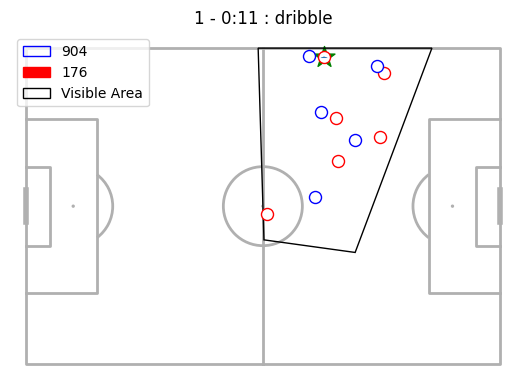

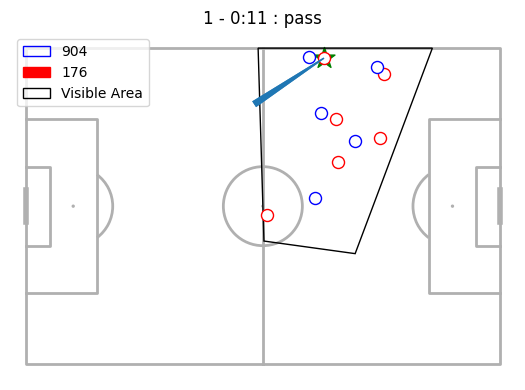

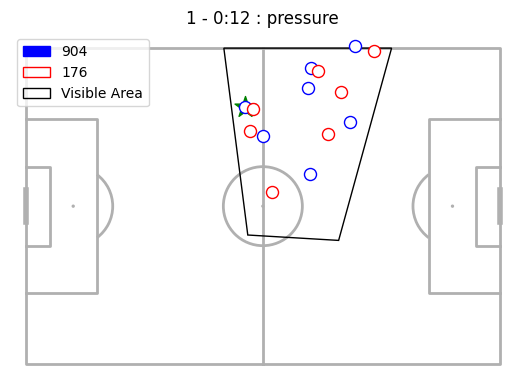

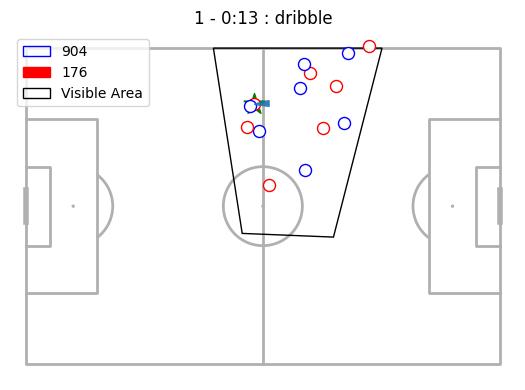

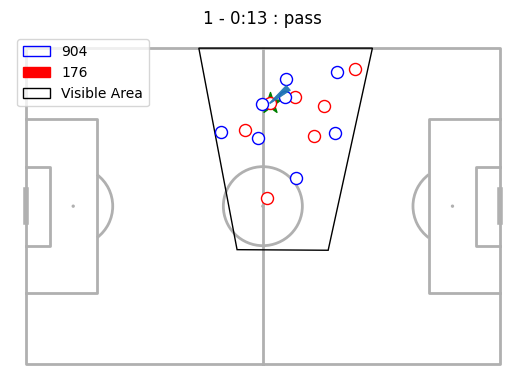

In [104]:
pressure_temp_idx = df_actions_press.index[1]
# pressure_temp_idx = counterpress_list[2]

color_list = ['b', 'r']
HOMETEAMID = games[games['game_id']==GAMEID]['home_team_id'].values[0]
AWAYTEAMID = games[games['game_id']==GAMEID]['away_team_id'].values[0]

for idx in range(pressure_temp_idx - 2, pressure_temp_idx + 3):
    event_row = df_actions.loc[idx]
    event_id = event_row['original_event_id']
    original_event_row = df_events[df_events['event_id'] == event_id]
    if len(original_event_row) == 0:
        continue

    period = event_row['period_id']
    minutes, seconds = divmod(event_row['time_seconds'], 60)
    minutes, seconds = int(minutes), int(seconds)
    event_type = actiontypes[event_row['type_id']]

    p = Pitch(pitch_type='statsbomb')
    fig, ax = p.draw(figsize=(6, 4))
    if event_row['team_id'] == HOMETEAMID:
        event_col = color_list[0]
        opponent_col = color_list[1]
    else:
        event_col = color_list[1]
        opponent_col = color_list[0]

    # Plot Action    
    start_x, start_y = original_event_row['location'].values[0]
    if event_row['team_id'] != HOMETEAMID:
        start_x = 120 - start_x
        start_y = 80 - start_y
    p.scatter(start_x, start_y, ax = ax, color = 'g', marker='*', s=250)

    # Plot end position if exists
    if len(original_event_row['extra'].values[0]) != 0:
        if 'end_location' in original_event_row['extra'].values[0][original_event_row['type_name'].values[0].lower()]:
            end_x, end_y = original_event_row['extra'].values[0][original_event_row['type_name'].values[0].lower()]['end_location']
            if event_row['team_id'] != HOMETEAMID:
                end_x = 120 - end_x
                end_y = 80 - end_y

            p.lines(xstart=start_x, ystart=start_y, xend=end_x, yend=end_y, ax=ax, comet=True)

    # Visualize camera visible area
    df_frames_temp = df_frames[df_frames['id'] == event_row['original_event_id']]

    visible_area = df_frames_temp.visible_area.iloc[0]
    visible_area = np.array(visible_area).reshape(-1, 2)
    if event_row['team_id'] != HOMETEAMID:
        visible_area[:, 0] = 120 - visible_area[:, 0] 
        visible_area[:, 1] = 80 - visible_area[:, 1] 

    p.polygon([visible_area], facecolor='none', edgecolor='k', linewidth=1, ax=ax)

    # Separate teammates and opponents
    teammates = df_frames_temp[(df_frames_temp['teammate']) & (df_frames_temp['actor']==False)]
    opponents = df_frames_temp[~df_frames_temp['teammate']]

    for idx, player_row in df_frames_temp.iterrows():
        if player_row.teammate:
            player_col = event_col
        else:
            player_col = opponent_col
        
        player_x, player_y = player_row.location
        if event_row['team_id'] != HOMETEAMID:
            player_x = 120 - player_x
            player_y = 80 - player_y
        # p.scatter(player_x, player_y, ax=ax, color=player_col)
        p.scatter(player_x, player_y, ax=ax, color='white', edgecolor=player_col, s=75)
        # ax.text(player_x-4, player_y - 3, idx, fontsize=8, color='black', weight='bold')
    ax.set_title(f"{period} - {minutes}:{seconds} : {event_type}")

    # Add legend for teammates and opponents
    if event_row['team_id'] == HOMETEAMID:
        home_patch = mpatches.Patch(edgecolor=color_list[0],  facecolor=color_list[0], label=HOMETEAMID)
        opponent_patch = mpatches.Patch(edgecolor=color_list[1],  facecolor='none', label=AWAYTEAMID)
    else:
        home_patch = mpatches.Patch(edgecolor=color_list[0],  facecolor='none', label=HOMETEAMID)
        opponent_patch = mpatches.Patch(edgecolor=color_list[1],  facecolor=color_list[1], label=AWAYTEAMID)
    polygon_patch = mpatches.Patch(edgecolor='k', facecolor='none', label='Visible Area')
    ax.legend(handles=[home_patch, opponent_patch, polygon_patch], loc='upper left')
    

In [139]:
def calculate_distance(x1, y1, x2, y2):
    """Calculate Euclidean distance between two points."""
    return np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

# Initialize new columns in actions
df_actions_press['teammate_1_x'] = np.nan
df_actions_press['teammate_1_y'] = np.nan
df_actions_press['teammate_2_x'] = np.nan
df_actions_press['teammate_2_y'] = np.nan
df_actions_press['opponent_1_x'] = np.nan
df_actions_press['opponent_1_y'] = np.nan
df_actions_press['opponent_2_x'] = np.nan
df_actions_press['opponent_2_y'] = np.nan
df_actions_press['opponent_3_x'] = np.nan
df_actions_press['opponent_3_y'] = np.nan


for idx, action in df_actions_press.iterrows():
    # Get the start_x and start_y of the current action
    start_x = action['start_x']
    start_y = action['start_y']
    event_id = action['original_event_id']

    # Get the player locations for the same original_event_id from df_frames
    frame_event = df_frames[df_frames['id'] == event_id]
    if frame_event.shape[0] == 0:
        continue

    frame_event.loc[:, ['location_x', 'location_y']] = _convert_locations(
    frame_event.loc[:, 'location'],
    shot_fidelity_version,
    )

    # Separate teammates and opponents
    teammates = frame_event[(frame_event['teammate']) & (frame_event['actor']==False)]
    opponents = frame_event[~frame_event['teammate']]

    # Calculate distances to teammates
    teammates['distance'] = teammates.apply(lambda row: calculate_distance(start_x, start_y, row['location_x'], row['location_y']), axis=1)
    closest_teammates = teammates.nsmallest(2, 'distance')

    # Calculate distances to opponents
    opponents['distance'] = opponents.apply(lambda row: calculate_distance(start_x, start_y, row['location_x'], row['location_y']), axis=1)
    closest_opponents = opponents.nsmallest(3, 'distance')

    # Add the closest teammates' locations to df_actions_press
    if len(closest_teammates) >= 2 and len(closest_opponents) >= 3:
        if action['team_id'] != HOMETEAMID:
            df_actions_press.at[idx, 'teammate_1_x'] = spadlconfig.field_length - closest_teammates.iloc[0]['location_x']
            df_actions_press.at[idx, 'teammate_1_y'] = spadlconfig.field_width - closest_teammates.iloc[0]['location_y']
            df_actions_press.at[idx, 'teammate_2_x'] = spadlconfig.field_length - closest_teammates.iloc[1]['location_x']
            df_actions_press.at[idx, 'teammate_2_y'] = spadlconfig.field_width - closest_teammates.iloc[1]['location_y']
        
            df_actions_press.at[idx, 'opponent_1_x'] = spadlconfig.field_length - closest_opponents.iloc[0]['location_x']
            df_actions_press.at[idx, 'opponent_1_y'] = spadlconfig.field_width - closest_opponents.iloc[0]['location_y']
            df_actions_press.at[idx, 'opponent_2_x'] = spadlconfig.field_length - closest_opponents.iloc[1]['location_x']
            df_actions_press.at[idx, 'opponent_2_y'] = spadlconfig.field_width - closest_opponents.iloc[1]['location_y']
            df_actions_press.at[idx, 'opponent_3_x'] = spadlconfig.field_length - closest_opponents.iloc[2]['location_x']
            df_actions_press.at[idx, 'opponent_3_y'] = spadlconfig.field_width - closest_opponents.iloc[2]['location_y']
    else:
        continue
        

/tmp/ipykernel_1339366/845217925.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_actions_press['teammate_1_x'] = np.nan
/tmp/ipykernel_1339366/845217925.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_actions_press['teammate_1_y'] = np.nan
/tmp/ipykernel_1339366/845217925.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

/tmp/ipykernel_1339366/845217925.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  opponents['distance'] = opponents.apply(lambda row: calculate_distance(start_x, start_y, row['location_x'], row['location_y']), axis=1)
/tmp/ipykernel_1339366/845217925.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teammates['distance'] = teammates.apply(lambda row: calculate_distance(start_x, start_y, row['location_x'], row['location_y']), axis=1)
/tmp/ipykernel_1339366/845217925.py:43: SettingWithCopyWarning: 
A v

In [140]:
df_actions_press.dropna(inplace=True)
print(f"# of Pressure events in one match : {len(df_actions_press)}")
df_actions_press.head()

# of Pressure events in one match : 187


/tmp/ipykernel_1339366/1020448394.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_actions_press.dropna(inplace=True)


,game_id,original_event_id,period_id,time_seconds,team_id,player_id,start_x,start_y,end_x,end_y,type_id,result_id,bodypart_id,action_id,teammate_1_x,teammate_1_y,teammate_2_x,teammate_2_y,opponent_1_x,opponent_1_y,opponent_2_x,opponent_2_y,opponent_3_x,opponent_3_y
38,3895302,9c1c3a13-867e-45a0-ac1d-4bd53c758e26,1,49.616,176,8826.0,66.75625,63.2975,66.75625,63.2975,23,1,0,38,56.914750,28.608130,51.569314,37.321323,48.758513,17.271211,43.947333,30.650080,65.577837,27.915752
45,3895302,031c2b95-22d3-4635-b1ae-c3cd3a7f2a00,1,57.595,176,8784.0,87.75625,24.1125,87.75625,24.1125,23,1,0,45,60.327143,33.827673,61.691708,22.463518,61.003874,42.395204,68.846830,58.846260,68.058455,25.496254
58,3895302,37b74872-a35f-48e4-99f5-b5798241d453,1,68.750,176,34870.0,77.51875,19.6925,77.51875,19.6925,23,1,0,58,51.929840,35.358697,64.120061,26.401130,54.527881,27.258621,63.073732,45.447783,50.109231,18.176663
61,3895302,ace8b81d-4775-48b4-8fac-30809fc30b4d,1,72.027,176,21865.0,74.98125,27.6825,74.98125,27.6825,23,1,0,61,53.935450,33.929775,65.615008,26.328318,50.238062,22.615242,57.111754,26.852846,50.250618,15.090588
70,3895302,cdddc9d6-c5ae-4c39-b250-6e8c00ff7ac7,1,84.841,176,31100.0,108.75625,34.7375,108.75625,34.7375,23,1,0,70,74.193374,28.749028,78.757552,20.430147,70.528649,21.989662,77.594533,14.032159,81.149292,9.558376


In [141]:
def shots(actions: DataFrame[SPADLSchema], nr_actions: int = 10) -> pd.DataFrame:
    """Determine whether the team possessing the ball scored a goal within the next x actions.

    Parameters
    ----------
    actions : pd.DataFrame
        The actions of a game.
    nr_actions : int, default=10  # noqa: DAR103
        Number of actions after the current action to consider.

    Returns
    -------
    pd.DataFrame
        A dataframe with a column 'scores' and a row for each action set to
        True if a goal was scored by the team possessing the ball within the
        next x actions; otherwise False.
    """
    # merging goals, owngoals and team_ids

    shots = actions["type_name"] == "shot"
    y = pd.concat([shots, actions["team_id"]], axis=1)
    y.columns = ["shot", "team_id"]

    # adding future results
    for i in range(1, nr_actions):
        for c in ["team_id", "shot"]:
            shifted = y[c].shift(-i)
            shifted[-i:] = y[c].iloc[len(y) - 1]
            y["%s+%d" % (c, i)] = shifted

    res = y["shot"]
    for i in range(1, nr_actions):
        gi = y["shot+%d" % i] & (y["team_id+%d" % i] == y["team_id"])
        res = res | gi

    return pd.DataFrame(res, columns=["shots"])


In [143]:
# yfns = [lab.scores, lab.concedes, lab.goal_from_shot]
yfns = [shots]

Y = pd.concat([fn(spadl.add_names(df_actions)) for fn in yfns], axis=1)

In [152]:
df_actions

,game_id,original_event_id,period_id,time_seconds,team_id,player_id,start_x,start_y,end_x,end_y,type_id,result_id,bodypart_id,action_id
0,3895302,221b0c8d-6386-4ae8-bb4a-a1dc98742312,1,3.417,176,34870.0,66.66875,46.0425,68.41875,46.7225,0,1,5,0
1,3895302,77809242-1460-4395-8779-94a0cfc275b1,1,3.870,176,12299.0,68.41875,46.7225,68.41875,46.4675,21,1,0,1
2,3895302,ff56e821-21e9-4cef-ba2a-7eb5eb3769c6,1,4.732,176,12299.0,68.41875,46.4675,89.33125,48.6775,0,1,5,2
3,3895302,cf9088bc-7e59-4d57-8ac5-31658da858bb,1,6.728,176,31100.0,89.33125,48.6775,89.33125,49.1025,21,1,0,3
4,3895302,4464cb75-f45f-4508-8444-2560d1625d06,1,7.622,176,31100.0,89.33125,49.1025,90.99375,66.1875,0,1,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2877,3895302,f908d853-a3e9-4ad7-99b4-6aef1f3e3286,2,2660.647,176,12299.0,69.73125,57.1775,69.73125,57.1775,23,1,0,2877
2878,3895302,4e61f75d-564b-4478-a2f0-4b7e20e8600e,2,2661.113,904,10336.0,57.79375,44.8375,78.18125,20.9525,0,1,4,2878
2879,3895302,91466764-aec7-4fac-a024-dd3deee3c737,2,2662.580,904,40724.0,78.18125,20.9525,93.05625,26.5625,21,1,0,2879
2880,3895302,e75b1a76-8aca-461f-846f-70b8b9e35fa9,2,2662.844,176,24179.0,98.69375,32.2725,98.69375,32.2725,23,1,0,2880


In [144]:
total_X = []
total_Y = []

for game_id in games.game_id.values:
    df_events = SBL.events(game_id=game_id)
    HOMETEAMID = games[games['game_id']==game_id]['home_team_id'].values[0] 
    actions = convert_to_actions(df_events, home_team_id=HOMETEAMID)

    actions_press = actions[actions.type_id==23]
    # Initialize new columns in actions
    actions_press['teammate_1_x'] = np.nan
    actions_press['teammate_1_y'] = np.nan
    actions_press['teammate_2_x'] = np.nan
    actions_press['teammate_2_y'] = np.nan
    actions_press['opponent_1_x'] = np.nan
    actions_press['opponent_1_y'] = np.nan
    actions_press['opponent_2_x'] = np.nan
    actions_press['opponent_2_y'] = np.nan
    actions_press['opponent_3_x'] = np.nan
    actions_press['opponent_3_y'] = np.nan

    df_frames = sb.frames(match_id=game_id)
    for idx, action in actions_press.iterrows():
        # Get the start_x and start_y of the current action
        start_x = action['start_x']
        start_y = action['start_y']
        event_id = action['original_event_id']

        # Get the player locations for the same original_event_id from df_frames
        frame_event = df_frames[df_frames['id'] == event_id]
        if frame_event.shape[0] == 0:
            continue

        frame_event.loc[:, ['location_x', 'location_y']] = _convert_locations(
        frame_event.loc[:, 'location'],
        shot_fidelity_version,
        )

        # Separate teammates and opponents
        teammates = frame_event[(frame_event['teammate']) & (frame_event['actor']==False)]
        opponents = frame_event[~frame_event['teammate']]

        if teammates.shape[0] < 2 or opponents.shape[0] < 3:
            continue

        # Calculate distances to teammates
        teammates['distance'] = teammates.apply(lambda row: calculate_distance(start_x, start_y, row['location_x'], row['location_y']), axis=1)
        closest_teammates = teammates.nsmallest(2, 'distance')

        # Calculate distances to opponents
        opponents['distance'] = opponents.apply(lambda row: calculate_distance(start_x, start_y, row['location_x'], row['location_y']), axis=1)
        closest_opponents = opponents.nsmallest(3, 'distance')

        # Add the closest teammates' locations to actions_press
        if len(closest_teammates) >= 2 and len(closest_opponents) >= 3:
            if action['team_id'] != HOMETEAMID:
                actions_press.at[idx, 'teammate_1_x'] = spadlconfig.field_length - closest_teammates.iloc[0]['location_x']
                actions_press.at[idx, 'teammate_1_y'] = spadlconfig.field_width - closest_teammates.iloc[0]['location_y']
                actions_press.at[idx, 'teammate_2_x'] = spadlconfig.field_length - closest_teammates.iloc[1]['location_x']
                actions_press.at[idx, 'teammate_2_y'] = spadlconfig.field_width - closest_teammates.iloc[1]['location_y']
            
                actions_press.at[idx, 'opponent_1_x'] = spadlconfig.field_length - closest_opponents.iloc[0]['location_x']
                actions_press.at[idx, 'opponent_1_y'] = spadlconfig.field_width - closest_opponents.iloc[0]['location_y']
                actions_press.at[idx, 'opponent_2_x'] = spadlconfig.field_length - closest_opponents.iloc[1]['location_x']
                actions_press.at[idx, 'opponent_2_y'] = spadlconfig.field_width - closest_opponents.iloc[1]['location_y']
                actions_press.at[idx, 'opponent_3_x'] = spadlconfig.field_length - closest_opponents.iloc[2]['location_x']
                actions_press.at[idx, 'opponent_3_y'] = spadlconfig.field_width - closest_opponents.iloc[2]['location_y']
        else:
            continue
        
    # actions now contains new columns with the closest teammates' and opponents' locations
    actions_press.dropna(inplace=True)

    yfns = [shots]
    Y = pd.concat([fn(spadl.add_names(actions)) for fn in yfns], axis=1)
    Y_press = Y.loc[actions_press.index]

    total_X.append(actions_press)
    total_Y.append(Y_press)

/home/ubuntu/miniforge3/envs/mm/lib/python3.10/site-packages/socceraction/data/statsbomb/loader.py:337: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  eventsdf["under_pressure"] = eventsdf["under_pressure"].fillna(False).astype(bool)
/home/ubuntu/miniforge3/envs/mm/lib/python3.10/site-packages/socceraction/data/statsbomb/loader.py:338: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  eventsdf["counterpress"] = eventsdf["counterpress"].fillna(False).astype(bool)
/tmp/ipykernel_1339366/3252896284.py:61: FutureWarning: A value is trying to be set on a copy of a

In [145]:
total_X = pd.concat(total_X).reset_index(drop=True)
total_Y = pd.concat(total_Y).reset_index(drop=True)

In [146]:
input_X = total_X[["start_x", "end_y", "teammate_1_x", "teammate_1_y", "teammate_2_x", "teammate_2_y", "opponent_1_x", "opponent_1_y", "opponent_2_x", "opponent_2_y", "opponent_3_x", "opponent_3_y"]]
input_X

,start_x,end_y,teammate_1_x,teammate_1_y,teammate_2_x,teammate_2_y,opponent_1_x,opponent_1_y,opponent_2_x,opponent_2_y,opponent_3_x,opponent_3_y
0,51.75625,51.2975,56.914750,28.608130,51.569314,37.321323,48.758513,17.271211,65.577837,27.915752,43.947333,30.650080
1,72.75625,12.1125,60.327143,33.827673,71.822016,37.076277,61.003874,42.395204,68.846830,58.846260,68.058455,25.496254
2,62.51875,7.6925,51.929840,35.358697,71.283159,43.860316,63.073732,45.447783,54.527881,27.258621,67.975540,28.524647
3,59.98125,15.6825,53.935450,33.929775,74.315678,43.160486,65.822886,48.965907,57.111754,26.852846,50.238062,22.615242
4,93.75625,22.7375,74.193374,28.749028,78.757552,20.430147,70.528649,21.989662,77.594533,14.032159,88.107858,40.013743
...,...,...,...,...,...,...,...,...,...,...,...,...
5039,63.83125,15.1725,54.605108,38.582339,48.417736,27.335962,56.794674,26.398614,52.974507,20.948615,44.128106,18.589479
5040,70.56875,2.0825,76.041838,43.453188,58.597118,18.244182,70.400108,45.093176,58.496682,16.947582,66.019305,15.165087
5041,98.21875,3.8675,82.526947,33.078411,82.797272,16.482720,77.101573,43.107800,73.388362,26.918082,79.776418,16.253911
5042,31.63125,49.0025,57.937109,28.413578,58.474497,37.537296,52.515782,33.799880,42.466855,26.973100,42.919555,36.889141


In [147]:
%%time
# 3. train classifiers F(X) = Y
import xgboost

Y_hat = pd.DataFrame()
models = {}
for col in list(total_Y.columns):
    model = xgboost.XGBClassifier(n_estimators=50, max_depth=3, n_jobs=-3, verbosity=1, enable_categorical=True)
    model.fit(input_X, total_Y[col])
    models[col] = model

CPU times: user 2min 26s, sys: 531 ms, total: 2min 27s
Wall time: 24.9 s


In [148]:
from sklearn.metrics import brier_score_loss, roc_auc_score, log_loss

testX, testY = input_X, total_Y

def evaluate(y, y_hat):
    p = sum(y) / len(y)
    base = [p] * len(y)
    brier = brier_score_loss(y, y_hat)
    print(f"  Brier score: %.5f (%.5f)" % (brier, brier / brier_score_loss(y, base)))
    ll = log_loss(y, y_hat)
    print(f"  log loss score: %.5f (%.5f)" % (ll, ll / log_loss(y, base)))
    print(f"  ROC AUC: %.5f" % roc_auc_score(y, y_hat))

for col in testY.columns:
    Y_hat[col] = [p[1] for p in models[col].predict_proba(testX)]
    print(f"### Y: {col} ###")
    evaluate(testY[col], Y_hat[col])

### Y: shots ###
  Brier score: 0.00521 (0.43646)
  log loss score: 0.02048 (0.31316)
  ROC AUC: 0.99911


In [149]:
# x로 끝나는 열에 대해서는 120 - value 적용
input_X.loc[:, input_X.columns.str.endswith('x')] = input_X.loc[:, input_X.columns.str.endswith('x')].apply(lambda x: x/spadlconfig.field_length)

# y로 끝나는 열에 대해서는 80 - value 적용
input_X.loc[:, input_X.columns.str.endswith('y')] = input_X.loc[:, input_X.columns.str.endswith('y')].apply(lambda y: y/spadlconfig.field_width)

/tmp/ipykernel_1339366/2744165781.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  input_X.loc[:, input_X.columns.str.endswith('x')] = input_X.loc[:, input_X.columns.str.endswith('x')].apply(lambda x: x/spadlconfig.field_length)
/tmp/ipykernel_1339366/2744165781.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  input_X.loc[:, input_X.columns.str.endswith('y')] = input_X.loc[:, input_X.columns.str.endswith('y')].apply(lambda y: y/spadlconfig.field_width)


In [150]:
from gplearn.genetic import SymbolicClassifier

# est = SymbolicClassifier(parsimony_coefficient=.01,
#                          feature_names=input_X.columns,
#                          random_state=1)

est = SymbolicClassifier(
    population_size=1000,  # 인구 집단 크기 증가
    generations=30,  # 더 많은 세대
    tournament_size=20,  # 더 큰 토너먼트 크기
    stopping_criteria=0.95,  # 조기 중단 기준
    const_range=(-1, 1),  # 상수 범위 제한
    parsimony_coefficient=0.001,  # 과적합 방지, 낮은 값으로 복잡한 수식을 억제
    p_crossover=0.8,  # 교차 확률 증가
    p_subtree_mutation=0.1,  # 서브트리 돌연변이
    p_hoist_mutation=0.05,  # 호이스트 돌연변이
    p_point_mutation=0.05,  # 포인트 돌연변이
    function_set=['add', 'mul', 'sub'],  # 더 복잡한 함수 추가
    verbose=1,  # 진행 상황 출력
    feature_names=input_X.columns,  # 피처 이름
    random_state=1,  # 재현성
    n_jobs=-1,  # 병렬 처리
    init_depth= (2,4)
)

est.fit(input_X, total_Y)

    |   Population Average    |             Best Individual              |
---- ------------------------- ------------------------------------------ ----------
 Gen   Length          Fitness   Length          Fitness      OOB Fitness  Time Left


   0    10.69         0.962101       31         0.145531              N/A      1.19m


SymbolicClassifier(const_range=(-1, 1),
                   feature_names=Index(['start_x', 'end_y', 'teammate_1_x', 'teammate_1_y', 'teammate_2_x',
       'teammate_2_y', 'opponent_1_x', 'opponent_1_y', 'opponent_2_x',
       'opponent_2_y', 'opponent_3_x', 'opponent_3_y'],
      dtype='object'),
                   function_set=['add', 'mul', 'sub'], generations=30,
                   init_depth=(2, 4), n_jobs=-1, p_crossover=0.8,
                   p_hoist_mutation=0.05, p_point_mutation=0.05,
                   p_subtree_mutation=0.1, random_state=1,
                   stopping_criteria=0.95, verbose=1)

In [151]:
y_true = total_Y.copy()
y_score = est.predict_proba(input_X)[:,1]
roc_auc_score(y_true, y_score)

0.8097103923832836

In [106]:
y_score

array([0.24087881, 0.14262342, 0.17312115, ..., 0.16872482, 0.17698413,
       0.13676573])